Have you ever found yourself scrolling through Instagram or Netflix and thought to yourself, jee, I wonder how it knows what I like and what to recommend? In this article, I aim to provide a shallow dive into content recommendation systems and share the method I'm using to build my current startup idea.

At the end of this article is a functional demo where you can see a very simple implementation of a recommendation system.

## A Note from the Author

I kicked off this article as a set of notes while tinkering with components for a startup I’m trying to get off the ground. As I worked through the prototypes, I naturally gravitated towards the algorithms described here. They just evolved as the logical next step.

My original idea (still evident in the demos and examples) was to break down content into a few key numbers that capture its characteristics. I figured that if different pieces of content shared similar numbers, they’d likely be alike, and I could use that property to recommend content. It turns out that my initial concept is strikingly similar to how embeddings function in today’s state-of-the-art systems!

Since these algorithms emerged organically during my prototyping, there may exist a few inconsistencies in the nomenclature and variable names throughout the article.

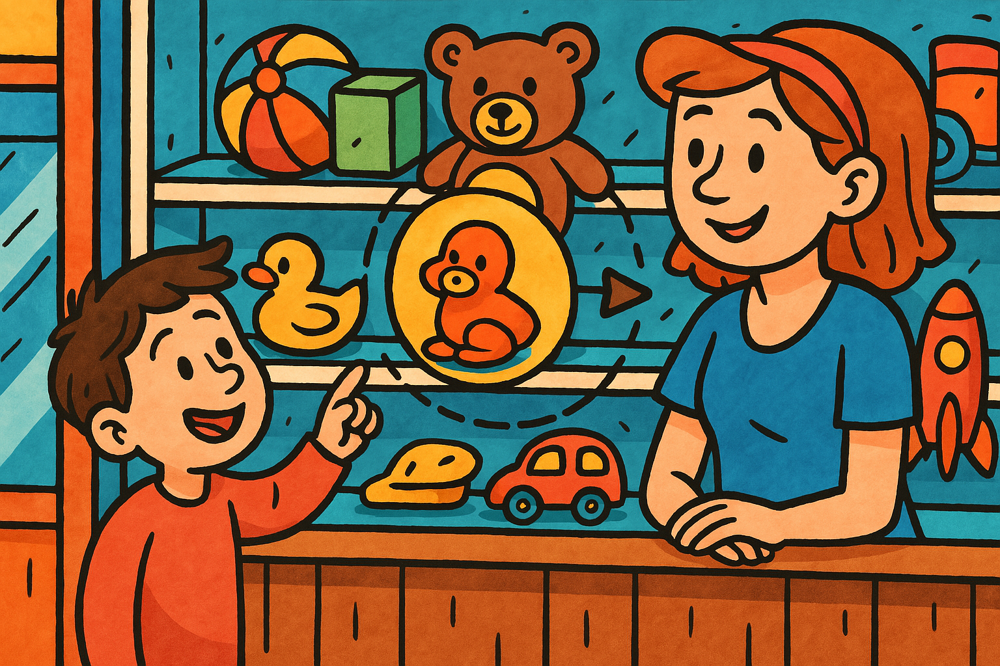

## Recommendation Systems - What & Why?

Ever been swamped with a massive library of content and wondered how to dish out the right stuff to the right folks? Think about a streaming service with heaps of movies and TV shows, or a social media app trying to keep users glued to their screens. That's where recommendation systems come into play.

These systems aim to match users with the content they’re likely to love, but it isn’t a walk in the park. Every person’s different so we need to find a way through which we can get to know them.

So this leads to recommendation systems having two important jobs:

1. **Recommend content**: serve up content that a user will resonate with
2. **Learn and adapt**: Use feedback to fine-tune and improve future recommendations

And let's be honest, a little boost to *maximize shareholder value* doesn't hurt either.

So, how can we build a recommendation system? Let's dive in!

## Vectorization and Categorization

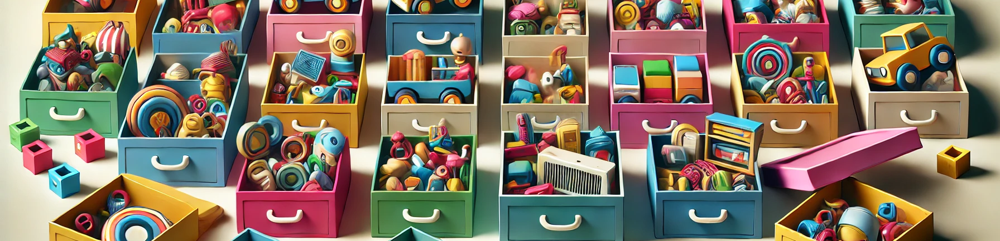

Imagine that you are the owner of a toy store. Your store sells all sorts of toys - dinosaurs, puppets, toy trucks, puzzles and so much more! How can you recommend the right toy to the right child?

A simple approach is to think about the different characteristics of each and every toy and note them down, say, in a spreadsheet. And we can group each and every toy based off these different characteristics.

Now, say we thought of 8 different characteristics and put them in a list. We can rate each and every toy in our toy store by these characteristics numerically. Putting together all 8 values for a single toy, we have *vectorized* the toy. For example:

* plush-toy
* animal
* mental
* red
* blue
* green
* gender-bias
* educational

We can then take each and every toy in the box of toys and rate each toy by the characteristics above.

```
               plush-toy animal mental red blue green gender-bias educational
dinosaur       0.9       0.9    0.2    0.1 0.1  0.8   0.2         0.2
puppet         0.7       0.7    0.4    0.3 0.3  0.3   0.0         0.8
puzzle         0.0       0.1    0.9    0.3 0.3  0.3   0.0         0.8
truck          0.0       0.0    0.7    0.8 0.0  0.0   0.7         0.0
```

In the table above, each row represents a **vector**, and each vector describes an object.

## Using Vectors for Content Recommendations

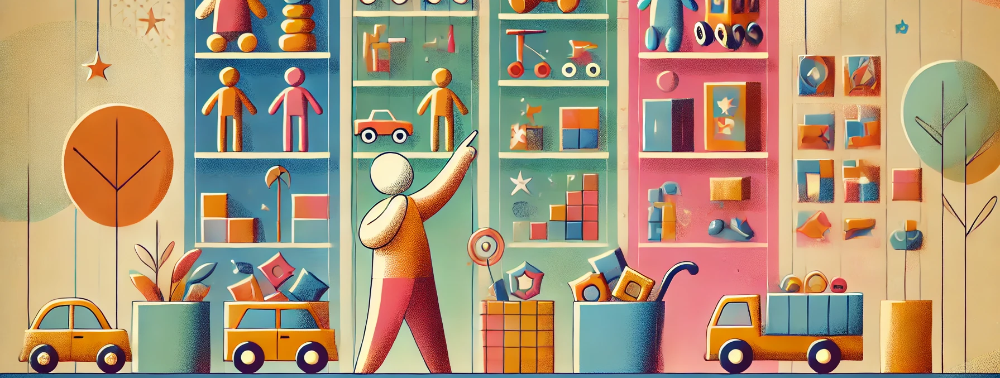

To find the best toy recommendations, we just need to compare vectors and look other vectors which look similar!

But, we aren't trying to just compare toys. We are trying to make recommendations for a user, Bob. But no worries, we can still use a similar approach by creating a vector for Bob himself - a vector which would represent his *ideal toy*.

> Hi, I'm Bob!
> My favorite toy is Clifford, a big red dog plushie I have at home. I can't sleep without it! Find me a new toy so he has a friend too!

We can create an initial vector for what we know ahout Bob and it would look like:

```
               plush-toy animal mental red blue green gender-bias educational
bob            0.9       0.9    0.0    0.9 0.0  0.0   0.0         0.0
```

Since all we know about Bob is that he likes his "big red dog plushie", we can create an initial embedding to match that.

## Embeddings

Embeddings are a way to represent data (such as words, sentences, images, literally anything) as vectors in continuous space. Embeddings attempt to capture the meaning and context behind data, make it easy to compare two different data.

Since embeddings are vectors, they have the following characteristics:

* They represent a point in high-dimensional space
* Two similar vectors are "nearby", and we can meaure the distance between them
* Vectors have a magnitude ($\|V\|$) and a direction, $\hat{V} = \frac{\vec{V}}{\|\vec{V}\|}$

High quality embedding vectors have a few extra characteristics on top of being vectors:

* Two embeddings with a similar direction (they point in the same direction) have a similar meaning
* Two embeddings with very different directions have a very different meaning
* Magnitude *can* represent intensity or confidence. However, most embedding-based systems tend to ignore it by normalizing vectors
* Embedding vectors can be *sparse* or *dense*. This is data science speak of how data is represented in vectors. Most embeddings are somewhere between both 🙂
    * **Dense vectors** are compact and almost all dimensions have non-zero values
    * **Sparse vectors** are extremely large vectors in which most dimensions, except one or a few, are non-zero.

In the example we have used, the vectors we created above were, in fact, simple embeddings, with just 8 elements. These fixed-size vectors which captured enough information about each toy to allow us to compare two toys against each other numerically and find Bob his perfect toy. In typical machine learning applications, the vectors we use tend to be much bigger, easily somewhere between 128 and millions!

## Nearest Neighbor (NN)

Similar embeddings convey a similar meaning, and we know that since embeddings are vectors, two similar embeddings will be located *close to each other*. Thus, we can use **nearest neighbor** algorithms to recommend content with a similar meaning. In the visualization below, 20 vectors have been plotted as points. The red point is our point of interest. The orange circle encloses the two **nearest neighbors** - the closest points to our point of interest.

How can we find the nearest neighbors?

Given our vector of interest, $\hat{V_0}$ and a list of vector, we can calculate the distance between $\hat{V_0}$ and $\hat{V_i}$ and sort for the vectors with the lowest euclidean distance.

$$
\operatorname{euclidean-distance}(\hat{V_0}, \hat{V_1}) = \sqrt{ \sum\limits_i \left( V_{0,j} - V_{i, j} \right)^2 }
$$

$$
\operatorname{nearest-neighbor}(\hat{V_0}, \hat{V}) = \operatorname{arg min}_{i}\left(\operatorname{euclidean-distance}(\hat{V_0}, \hat{V_i}) \right)
$$

Where $j$ is the index of an element in the vectors.

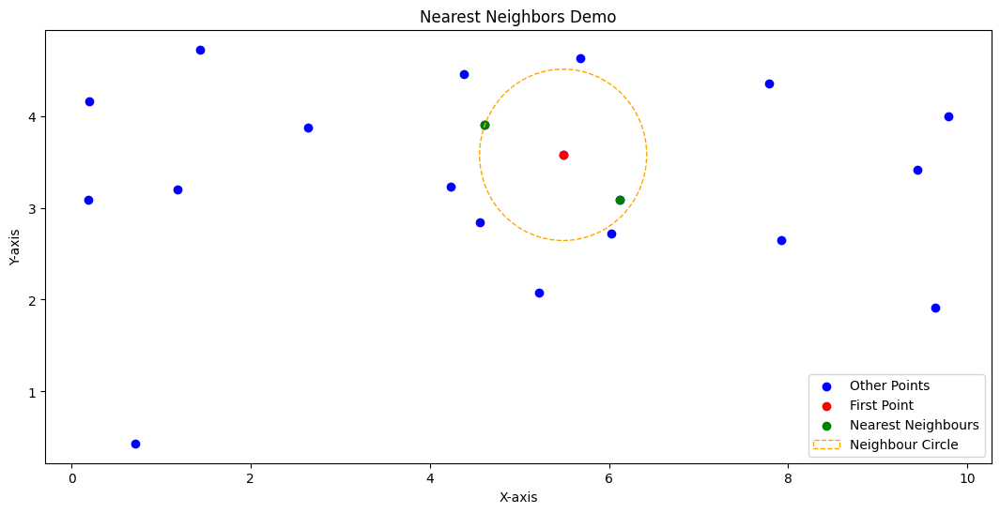

In [18]:
#% hidecode
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.patches import Circle

# Seed for reproducibility – so the points are the same every time, ya know
np.random.seed(0)

# Generate 10 random points in 2D space (scaled up a bit for visibility)
points = np.random.rand(20, 2) * (10, 5)

# First point (our reference mate)
first_point = points[0]

# Calculate Euclidean distances from the first point to all the others
distances = np.linalg.norm(points[1:] - first_point, axis=1)

# Get the indices of the two nearest neighbours (adding 1 to offset the exclusion of the first point)
nearest_indices = np.argsort(distances)[:2] + 1
nearest_points = points[nearest_indices]

# Determine the radius for the circle: the furthest distance among the two neighbours
radius = np.max(np.linalg.norm(nearest_points - first_point, axis=1))

# Set up the plot
fig, ax = plt.subplots(1, 1, figsize=(13, 6))
ax.scatter(points[:, 0], points[:, 1], color='blue', label='Other Points')
ax.scatter(first_point[0], first_point[1], color='red', label='First Point')
ax.scatter(nearest_points[:, 0], nearest_points[:, 1], color='green', label='Nearest Neighbours')

# Create and add the circle around the first point
circle = Circle(first_point, radius, fill=False, color='orange', linestyle='--', label='Neighbour Circle')
ax.add_artist(circle)

# Label the axes and set a title
ax.set_xlabel('X-axis')
ax.set_ylabel('Y-axis')
ax.set_title('Nearest Neighbors Demo')
ax.legend()

plt.show()

## Cosine Similarity

Since two embedding vectors which point in a similar direction have similar meaning, how can we know if two vectors are pointing in the same direction? We can use **cosine similarity** which inherently normalizes both vectors under comparison and provides a score to test if both vectors point in the same direction.

Cosine Similarity
: A measure of the whether two vectors point in the same directions, ranging from $[-1, 1]$
: $\operatorname{cosine-similarity}(\vec A,\vec B)=-1$ represents two vectors with opposite directions, or embeddings with the opposite meaning
: $\operatorname{cosine-similarity}(\vec A, \vec B)=1$ represents two vectors with the same direction, or embeddings with the exact same meaning.

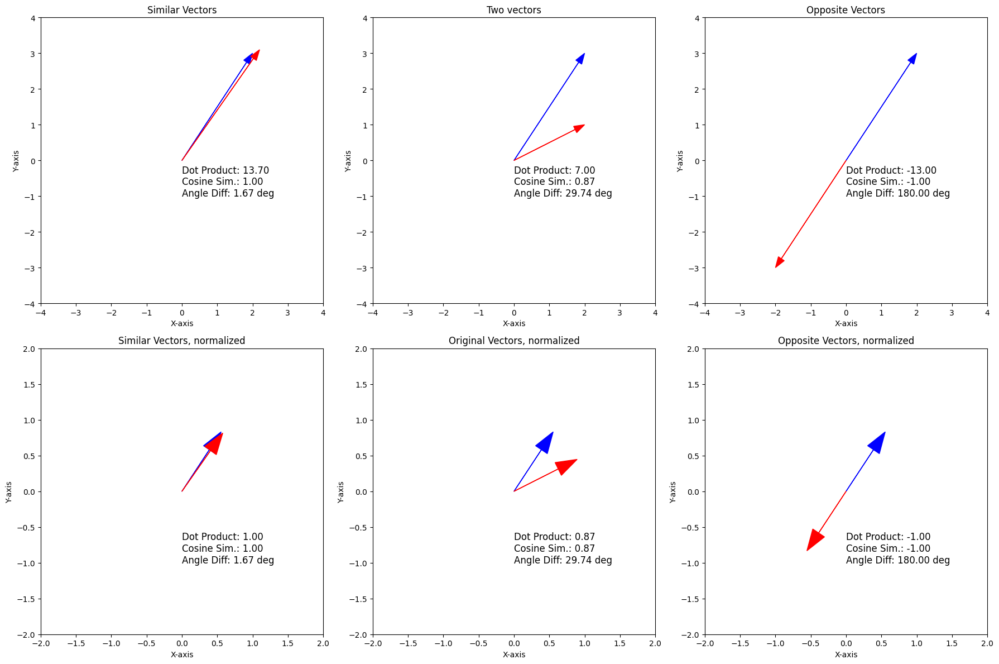

In [54]:
#% hidecode
import numpy as np
import matplotlib.pyplot as plt
import math

def plot_vector(ax, v1, v2, title, scale):
    # Calculate dot product and cosine similarity
    dot_product = np.dot(v1, v2)
    norm_v1 = np.linalg.norm(v1)
    norm_v2 = np.linalg.norm(v2)
    cosine_similarity = max(min(dot_product / (norm_v1 * norm_v2), 1), -1)
    arccos = math.acos(cosine_similarity) * 180 / math.pi
    
    # Plot vectors as arrows from the origin
    ax.arrow(0, 0, v1[0], v1[1], head_width=0.2, head_length=0.3, fc='blue', ec='blue', length_includes_head=True)
    ax.arrow(0, 0, v2[0], v2[1], head_width=0.2, head_length=0.3, fc='red', ec='red', length_includes_head=True)
    
    # Define plot limits
    max_val = scale
    ax.set_xlim(-max_val, max_val)
    ax.set_ylim(-max_val, max_val)
    ax.grid(False)
    
    # Set labels and title
    ax.set_xlabel('X-axis')
    ax.set_ylabel('Y-axis')
    ax.set_title(title)

    text = f"""Dot Product: {dot_product:.2f}
Cosine Sim.: {cosine_similarity:.2f}
Angle Diff: {arccos:.2f} deg"""
    ax.text(0, -1, text, fontsize=12)

def normalize(v):
    norm = np.linalg.norm(v)
    return v / norm if norm != 0 else v

# Define vector pairs for three scenarios:
# 1. Very similar vectors
v1_similar = np.array([2, 3])
v2_similar = np.array([2.2, 3.1])

# 2. Original vectors (for the middle graph)
v1_original = np.array([2, 3])
v2_original = np.array([2, 1])

# 3. Opposite vectors
v1_opposite = np.array([2, 3])
v2_opposite = np.array([-2, -3])

plt.rcParams['text.usetex'] = False
# Create subplots: one row, three columns
fig, axs = plt.subplots(2, 3, figsize=(18, 12))

plot_vector(axs[0][0], v1_similar, v2_similar, 'Similar Vectors', 4)
plot_vector(axs[0][1], v1_original, v2_original, 'Two vectors', 4)
plot_vector(axs[0][2], v1_opposite, v2_opposite, 'Opposite Vectors', 4)

plot_vector(axs[1][0], normalize(v1_similar), normalize(v2_similar), 'Similar Vectors, normalized', 2)
plot_vector(axs[1][1], normalize(v1_original), normalize(v2_original), 'Original Vectors, normalized', 2)
plot_vector(axs[1][2], normalize(v1_opposite), normalize(v2_opposite), 'Opposite Vectors, normalized', 2)

plt.tight_layout()
plt.show()

### The Mathematics

Our goal is to create a score that determines if two vectors are pointing in the same direction. How can we achieve that?

In linear algebra, we can take the **dot product** (also known as the **inner product**) of both vectors $\vec{A}$ and $\vec{B}$ which we want to compare. If both vectors point in the same direction, the dot product will be large. If the vectors point $90^\circ$ from each other (orthagonal), the dot product is 0. If both vectors point in opposite directions, the dot products will be extremely negative. How can we use this to our advantage?

Let's investigate the three ways how we can calculate the dot product:

$$\vec{A}\cdot \vec B = A_1B_1 \cdots A_NB_N$$
OR
$$\vec{A}\cdot \vec B = \sum\limits_{i=1}^N\left( a_nb_n \right)$$
OR
$$\vec{A}\cdot \vec B = \big\| A\big\|\big\| B\big\| \cos\theta$$

Where
* $\vec{A}\cdot \vec B$ is the dot product of vectors $\vec{A}$ and $\vec{B}$
* $A_n$ and $B_n$ are tne $n$th element in their respective vectors
* $\|A\|$ and $\|B\|$ are the *magnitude*s of vectors $\vec{A}$ and $\vec{B}$ respectively
* $\theta$ is the *angle* difference between both vectors

### $\cos\theta$

Given all of this, how can we create a score which rates how similar of a direction both vectors point in? In the third formula to calculate the dot product, we have $\cos\theta$. Given two vectors which are $0^\circ$, $90^\circ$ and $180^\circ$ apart, what is the output of $\cos\theta$?

$$\cos 0^\circ = \cos 0 \operatorname{radians} = 1$$
$$\cos 90^\circ = \cos \frac\pi2 \operatorname{radians} = 0$$
$$\cos 180^\circ = \cos \pi \operatorname{radians} -1$$

In lamen terms, when both vectors point in the same direction, $\cos\theta = 1$, and when they are opposite, $\cos\theta=-1$. And for those who may be a bit confused, degrees ($n^\circ$) and radians $n\operatorname{radians}$ are different measures of angles just like how Farenheight and Celcius are different measures of temperature.

We call the $\cos\theta$ term the **cosine similarity** of both vectors.

$\operatorname{cosine-similarity} = \cos\theta$

And to calculate it, we can isolate it:

$$\operatorname{cosine-similarity}(\vec{A}, \vec{B}) = \cos\theta = \frac{\vec A\cdot\vec B}{\big\| \vec A\big\| \big| \vec B\big\|}$$

Or numerically (harder to read, easier to implement in code):

$$\operatorname{cosine-similarity}(\vec{A}, \vec{B}) = \cos\theta =
\frac{\sum\limits_{i=1}^N \vec{A}_n\vec{B}_n}{\|\vec{A}\|\|\vec{B}\|} =
\frac{\sum\limits_{i=1}^N\vec{A}_n\vec{B}_n}{\sqrt{\sum\limits_{i=1}^N{\vec{A}_i^2}\sum\limits_{i=1}^N{\vec{B}_i^2}}}
$$

## Learning from Feedback

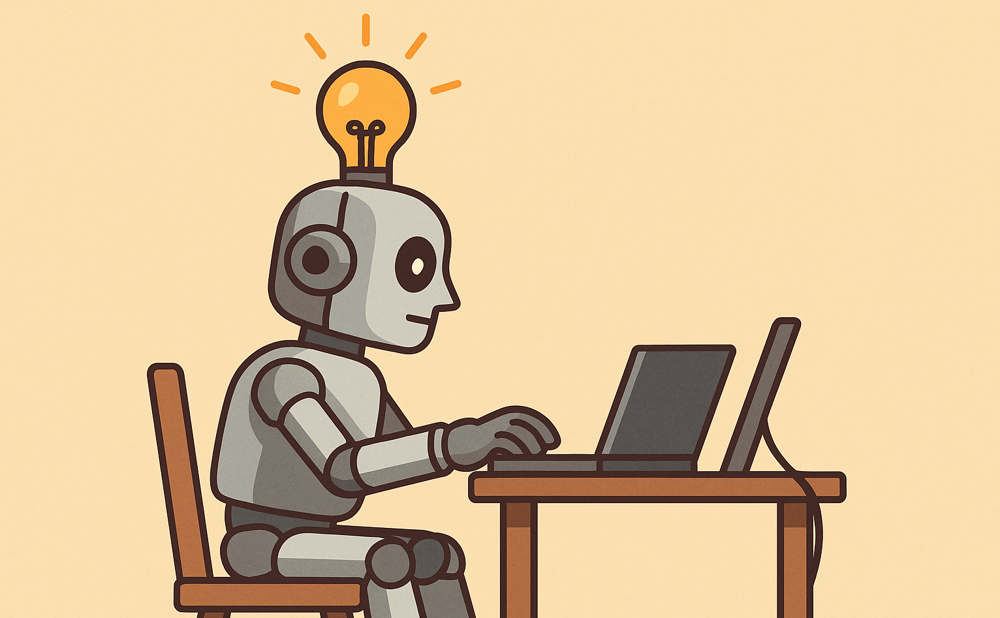

To make a powerful content recommendation system, the system needs to be able to take feedback to update its own knowledge. How can we achieve that? We can make observations on the user's behavior and update our knowledge base using those observations.

Let's start by giving an initial recommendation:

> Hi Bob, would you like this blue monkey plushie?

```
               plush-toy animal mental red blue green gender-bias educational
blue-monkey    0.9       0.9    0.0    0.0 0.9  0.0   0.0         0.0
```

We can then get Bob's feedback.

> Bob: ew, that thing? It's ugly! Am I 5? No thanks!

Now, using Bob's feedback, we can update his embedding vector.

$$V_\text{bob} = V_\text{bob} + \alpha F(\text{bob}, \text{blue-monkey}) \cdot V_{blue-monkey}$$

Where

* $V_\text{bob}$ is Bob's current embedding vector
* $V_\text{blue-monkey}$ is the blue monkey's current embedding vector
* $F(\text{bob}, \text{blue-monkey})$ is our observation of Bob's feedback. A negative number implies a poor fit and a positive number implies a good fit. In this case, since Bob did not like the blue monkey plushie, we can apply a feedback coefficient of $-1$.
* $\alpha$ is a **learning rate** - a hyperparameter which describes how fast we should update Bob's embedding vector.

We can also update the toy's embedding vector:

$$V_\text{blue-monkey} = V_\text{blue-monkey} + \beta F(\text{bob}, \text{blue-monkey}) \cdot V_{bob}$$

Where

* $V_\text{bob}$ and $V_\text{blue-monkey}$ are swapped compared to updating Bob's embedding vector
* $\beta$ is the learning rate on the toy's embedding vector.

Let's calculate, using $\alpha=0.1$ and $\beta=0.1$ and $F(\text{bob}, \text{blue-monkey})=-1$

```
                plush-toy animal mental red   blue  green gender-bias educational
bob (before)    0.9       0.9    0.0    0.9   0.0   0.0   0.0         0.0
blue-monkey (b) 0.9       0.9    0.0    0.0   0.9   0.0   0.0         0.0

bob (after)     0.81      0.81   0.0    0.9   -0.09 0.0   0.0         0.0
blue-monkey (a) 0.81      0.81   0.0    -0.09 0.9   0.0   0.0         0.0
```

Now, we have updated Bob's embedding vector with his feedback, along with the toy's embedding vector using his feedback!

## Vector / Embedding Initialization

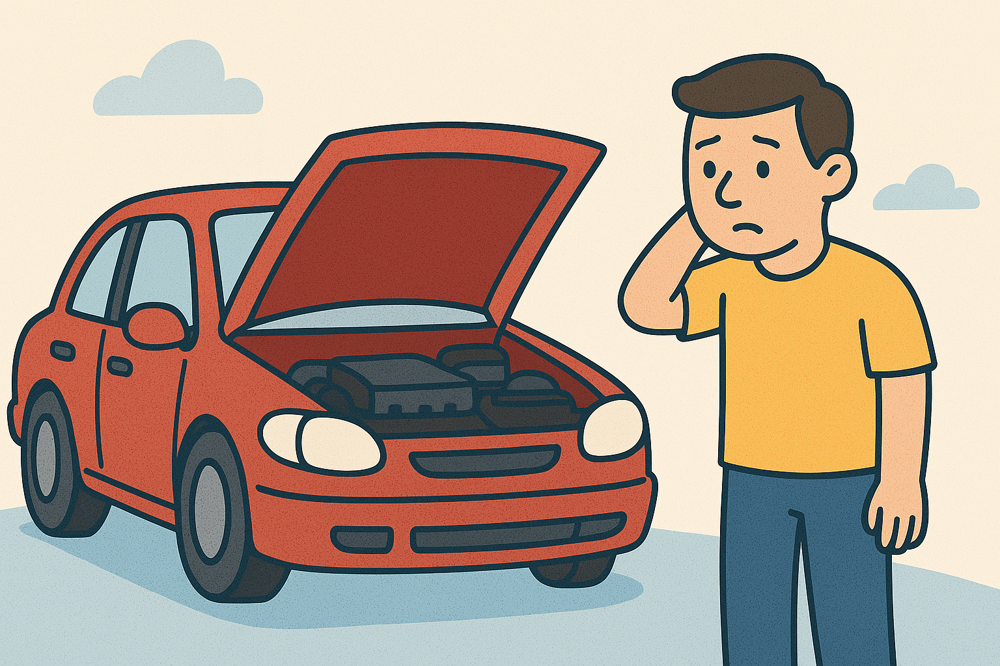

Now that we know how to use embeddings to recommend content, how do we actually compute our embeddings in the first place?

1. When it comes to text data, we can use pretrained embeddings such as Word2vec, GloVe or FastText
2. We can try frequency-based initialization (read my article on [TF-IDF](/for-dummies/search-engines/7))
3. SVD (singular value decomposition) or PCA (principal component analysis)
    **SVD** digests information into simpler parts to uncover hidden relationships
    **PCA** find the directions of greatest variance and tosses out the rest, leaving only the most important data
5. Transformers (such as BERT)

In fact, we can even use an LLM such as ChatGPT or Gemini to generate initial embeddings - that's how I generated default embeddings for Æsop's fables for the demo at the end!

## Embedding Initialization Doesn't need to be Perfect

Remember how our system can take feedback and learn? This means that if our vectors aren't perfect, they will gradually improve over time! Thus, why even overengineer our vector initialization?

We can do something much simpler:

We can initialize our embedding vectors (for the data AND for the user) with a simple approach:
* Randomly initialize each component
* Use the average vector in your entire dataset as the starting vector
* Initialize each component as $0$ (this does have some issues though)

Next, we can use apply feedback process gradually improve the accuracy of each embedding vector

This isn't perfect since the system recommendations will be of low quality until it has had enough time and feedback to improve.

## Demo - Recommender System for Æsop's fables

### Further Learning Tasks

1. Read the code, understand how it works
2. Update $\alpha$ and $\beta$ (`ALPHA` and `BETA`) variables and see how the learning changes. Try $\alpha = 0.5$ and $\beta = 0.3$, for example.
3. Add and remove `feedback` function calls
4. Identify how to user vector changes, as well as how a story's vector changes.

## At Scale

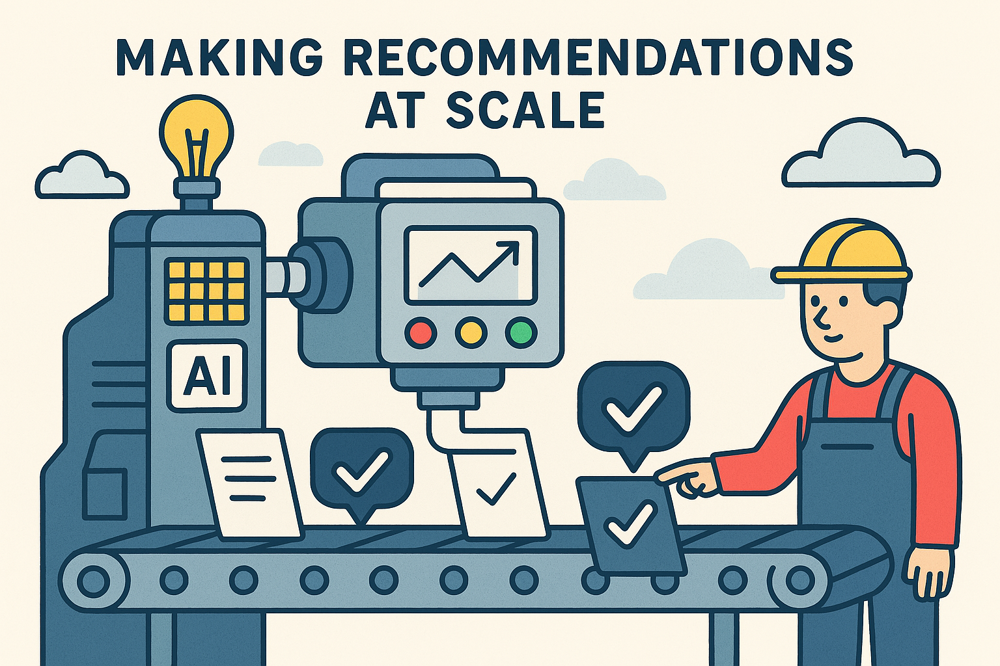

To keep the above demo simple, we used a linear search where we performed a cosine similarity between each and every one of Æsop's fables and the user's vector. This does not scale since it requires $O(n)$ time, where $n$ is the number of stories (or items) in the recommender system.

We can use **vector databases**, databases which are specifically tuned to be good at **approximate nearest neighbor** algorithm implementations. **Vector databases** such as *Pinecone*, and libraries such as *FAISS* efficiently store and retrieve vectors using approximate nearest neighbor methods. We will touch more into this later on.

## Ethics and Bias

The goal of this article was to describe how a simple recommendation system based off embeddings works. The methods described in this article are fully unsupervised. They don't rely on labeled data, but instead, try to cluster and find some meaning in it.

As machine learning predominantly controls more of our lives, we need to be mindful about ethics, and the harm it brings along with its benefits. It's important to pay attention to how our models develop unintended biases, make unfair recommendations, or even learn from bad behavior (which the internet is full of).

## Sources

* [TF-IDF](/for-dummies/search-engines/7)
* [Wikipedia: Recommender system](https://en.wikipedia.org/wiki/Recommender_system)
* [Datastax: What is Cosine Similarity](https://www.datastax.com/guides/what-is-cosine-similarity)
* [Wikipedia: Cosine Similarity](https://en.wikipedia.org/wiki/Cosine_similarity)
* [Wikipedia: Graph Database](https://en.wikipedia.org/wiki/Graph_database)
* [Wikipedia: Vector Database](https://en.wikipedia.org/wiki/Vector_database)
* ChatGPT - for reviewing this article and assisting with visuals
* Notebook sources - [on GitHub](https://github.com/yash101/Website/blob/master/notebooks/blogs/vectorization/vectorization-for-content-recommendation.ipynb).